# **Assignment 4**

Cory Melendez

### Background:
One of the most coveted types of prediction, maybe only second to knowing the lottery numbers, is that of the stock market. Stock traders, that is Non HFT/algo traders, will typically look to tools such as quantitative analysis (QA). They attempt to detect patterns that arise from human behavior, believed to be unchanging. This project instead attempts to use ML models in order to build up a scientifically more sound method than methods such as QA that can predict how the market will move in the very short term.

One of the challenges to this project, and will require further research, is to identity not only if our model will have an acceptable accuracy using the data below, but why. Markets are ever-changing, and are constantly affected not only by geoeconomic events, but geopolitical events as well. Identifying the circumstances where it *could* work and *when* it could work is just as important as building the model itself. We found paper 1, which goes over how researchers used this dataset, and paper 2, a summary of 100 published articles, to be a good starting point in understanding what we will call the 'reproducability' problem as well as understanding how to build our models better.

The last challenge is the size of the data, I'll be trimming the number of columns not only to stay under the column limit, but to better narrow down and understand the factors that contribute to the output.



### Project Description: 
This project's main aim is to output a binary classificiation that will be able to tell a theoritical day trader whether or not they should buy and sell a stock on a certain day.This project will use data from link below in order to build our ML models. We will also refer to the paper below in order for not only reference on how a model can be built, but to also refer to it for understanding the domain.

Our main methodology will be to groom the data into something that is digestible by the model. Since our aim is to only output a binary classification (yes/no), the question we will be asking our model is 'should i buy the stock at close today and sell at close of tomorrow'. This simple strategy will simplify the model greatly, but will require restructuring the data and creating a target column that our model predicts.

Our simple goals that define success is as follows: Can we beat not entering the market at all (not investing)? Can our model beat a trading algorithm that simply randomly outputs yes/no? A goal beyond that would be to answer: What other non-ML algorithms, in the same time and circumstances, can our model beat?


Data: https://archive.ics.uci.edu/ml/datasets/CNNpred%3A+CNN-based+stock+market+prediction+using+a+diverse+set+of+variables

Paper: https://reader.elsevier.com/reader/sd/pii/S0957417419301915?token=746C33D1046F2DDA4EE614C2A4606AF2260493F0DC652081FF1F03968E01DC023369A293A638CEE35E24DB8BB7EE1259&originRegion=us-east-1&originCreation=20230119051158

Paper 2: https://reader.elsevier.com/reader/sd/pii/S0957417421009441?token=EEE8A8BF467B1370F99F73C46DC7AD74D88F0AB17AC08F5137A3B16E14E69D382DE8A689EF492C09E0CF67690D289807&originRegion=us-east-1&originCreation=20230119052216

### Performance Metric: 

Our metric will be pretty simple, given any trade, or a group of trades, advised by the model, is: 

(current price - bought price ) * X > X * epsilon, where X is the amount of money that was invested and epsilon is any arbitrary small positive number

 
If this statement is true, then our model has outperformed our money not entering the market at all by an arbitrary small number.

Furthermore, 

does:

Sum(MLProfit) > Sum(RandomProfit) * epsilon

Where Sum(MLProfit) is the profit made from a arbitrary number of trades using our ML model greater, and Sum(RandomProfit) is the profit madae from an arbitrary number of trades using a random output algorithm, and epsilon is an arbitrary small number

If so, then we have beaten randomness by a factor of epsilon and have met our main objective.





### Setup Notebook

### Data Cleaning and Feature Transformers
Combine, remove, and create columns to give our model a better context for each trading day and how the market reacted on previous' days

## Preprocessing Pipeline

In [470]:
import sklearn as skl
import pandas as pd
import src.constants as const
from typing import List, Dict
from src.transformers import FeatureEngineeringPipelineFactory, FeatureEngineeringPipelineFactoryFactory

targetStocks: List[str] = const.STOCK_COLS + const.TREASURY_COLS

def create_feature_eng_pipeline(other_exchange_dfs: List[pd.DataFrame], includeDaysBackFeature: bool, includeTotalChangeOverDaysFeature: bool) -> Dict[str, skl.pipeline.Pipeline]:
  numberOfBackDayCombinations: List[List[int]] = [[1,2,3,5,10]]

  factoryFactory = FeatureEngineeringPipelineFactoryFactory(other_exchange_dfs)
  factories: Dict[str, FeatureEngineeringPipelineFactory] = factoryFactory.create_many(targetStocks, numberOfBackDayCombinations, includeDaysBackFeature, includeTotalChangeOverDaysFeature)

  _featureEngPipelines: Dict[str, skl.pipeline.Pipeline] = {}
  #todo: add back all the stocks, this is to save time for now
  for target_stock in [const.MSFT]:
    _featureEngPipelines[target_stock] = factories[target_stock].create()

  return _featureEngPipelines

In [471]:
initial_exchange = dl.load_nyse()
additional_exchange_dfs = dl.load_additional_exchanges()
featureEngPipelines: Dict[str, skl.pipeline.Pipeline] = create_feature_eng_pipeline(additional_exchange_dfs, True, True)

### Example of resulting transformed dataset

Now from above, we have a set of pipelines in 'pipelines' that we can fit on our initial dataframe.

I went ahead and created multiple pipelines and datasets, where each one has a different target stock. The one I will be using moving forward will be microsoft stock.



### Feature Engineering

From the last assignment, these were the features we were planning on engineering, however, after the extensive transformations above, some have changed or be removed completly.

* Research our stock symbols and decide what industry they belong to, add a column indicating the industry. This will be later used for a one hot encode
  * Removed:
    * In our dataset, we dont have have sufficient number of stocks to warrant this. We only a few industries that had more than one stock.
    * We added transformers that calculate the rate change of all stocks across several days. The model should be able to derive which stocks are correlated on itself without adding data to signal what industry that stock is in.

* Since this project would normally use a time series approach, we'll want to add additional columns to get around this. Each row has to be indepedent of the previous rows, so we will add the return % of one or several of the previous days to simulate time series. Since in our business context, we are trading on behalf of a day trader, we dont have to add many of these columns
  * Added: Added multiple columns signaling the % change or the total change (phi of % changes that were in the dataset).

* We will drop all features that are not listed in our data_dictionary.csv as the first step in our pipeline

  * Removed some columns from our data_dictionary due to some innaccuracies in the paper that was supplied by the researchers. Not quite sure why, but Gas, Silver, & Copper were described to be in the datasets but were absent.

* We'll have to massage our data a little bit. We know that there are some columns whose data is repeated across the CSVs (like stock prices and commodoties) so we can extract that information from just one of the CSVs. Then, we'll want to transform the rest of the columns (ex: close/volume) into multiple columns, so we have NYSE_Close, NYSE_Volume, NASDAQ_Close, NASDAQ_Volume, etc., so we dont have multiple rows representing the same day
  * Added: The resulting transformer that we created in this notebook wasnt changed much from the original description.

* We'll also need to extract the return % of each stock exchange, the data is a little weird where the % return for a stock exchange x is not in that csv for x. Example: Nasdaq doesnt have the % return for the nasdaq but has NYSE, S&P, etc., we'll want to make sure all % returns our in our dataset.
  * This one was a little odd, but our originaly analysis was accurate to the resulting transformer that we needed in this notebook

* Further investigation is also needed to combine and average: 
  1. The % return of each stock exchange
    * Modified: Instead of combining or averaging, we added columns to give each row more context as to what the change in the Close price was over various amounts of days
  2. Volume
    * Modified: Instead of combining or averaging, we added columns to give each row more context as what the cumulative change over various days were
  3. Closing price
    * Modified: This was merged with #1
* Lastly, we'll want to transform the date column into something that we can sort by if needed. We can transform this column from a format 'mm-dd-yyyy' to a number yyyymmdd which will rank by year first, then month, then day
  * Modified: Instead of a date, we kept our index and split it across multiple columns (day, month, year, day of week). My thinking was that some traders would trade differently in different parts of the year, and even on different days of the week.

#### Final list of features

1. DateToQuarterTransformer: transform the date into a quarter, that we'll later use a oneHotEncoder on

2. TreasuryRateTransformer: get the rate of change for treasury rates using today and x days ago

3. DaysBackRateTransformer: put the rate of change from x amount of days ago for our stocks

4. TotalChangeOverDaysTransformer: get the total % of change over last x amount of days for all of our stocks

5. WouldProfitTargetTransformer: Add a target column by looking one day into the future to see if the stock went up

6. ExchangeVolumeChangeOverTime: calculate the % rate of change for volume for every exchagne

7. ExchangeCloseRateChange: calculate the % rate of change for Close price for every exchange.

#### EDA post processing

There wasnt a whole lot to be gathered from our EDA from our datasets without the feature engineering we have done in this notebook. But ill include what we did since there were some correlated columns that exist that we can remove along with their corresponding dervied feature columns.

In [472]:
class RemoveBadRowsTransformer(BaseEstimator, TransformerMixin):

  def fit(self, X, y=None):
    return self

  def transform(self, X, y=None):
    X_ = X.copy()
    X_ = X_.drop(X_.tail(1).index)
    X_ = X_.drop(X_.head(15).index)
    return X_ 

class RemoveHighlyCorrCols(BaseEstimator, TransformerMixin): 
  def __init__(self, above_or_at: float):
    self.aboveOrAt = above_or_at

  def fit(self, X, y=None):
    _corr = X.corr()
    #find the columns with the highest correlation values and remove
    _corr = _corr.abs()
    _sol = (_corr.where(np.triu(np.ones(_corr.shape), k=1).astype(bool))
                      .stack()
                      .sort_values(ascending=True))
    #find highly correlated features
    l: set = set()
    for index, value in _sol.items():
      if value >= self.aboveOrAt and index[0] != index[1]:
        if index[0] not in l:
          l.add(index[0])
    
    self.remove = list(l)

    return self

  def transform(self, X, y=None):
    X_ = X.copy()
    X_.drop(columns=self.remove, inplace=True)
    return X_
  
class ExcludeColsStandardScaler(BaseEstimator, TransformerMixin): 
    def __init__(self, exclude_columns: List[str], target_stock: str):
      self.excludeColumns = exclude_columns
      self.targetStock = target_stock
    
    def fit(self, X, y = None):
      perform_on_set: set = set()
      for col in X.columns:
        if col not in self.excludeColumns:
          perform_on_set.add(col)

      performOnList = list(perform_on_set)
      X_ = X[performOnList]
      self.means = np.mean(X_, axis=0)
      self.stds = np.std(X_, axis=0) 

      return self

    def transform(self, X, y = None):
      exclude_cols = self.excludeColumns + [f'{self.targetStock}_WouldProfit']
      X_ = X.drop(columns=exclude_cols)

      X_ = (X_ - self.means) / self.stds

      for col in exclude_cols:
        X_[col] = X[col]

      return X_

class MyOneHotEncoder(BaseEstimator, TransformerMixin):
  def __init__(self, oneHotEncoder: skl.preprocessing.OneHotEncoder):
    self.oneHotEncoder: skl.preprocessing.OneHotEncoder = oneHotEncoder
  
  def fit(self, X, y=None):
    self.oneHotEncoder.fit(X,y)
    return self
  
  def transform(self, X, y=None):
    return self.oneHotEncoder.transform(X)


In [473]:
#reconfigure pipelines
# cat_cols2 = ['DayOfWeek', 'Day', 'Month', 'Year']
# cat_cols = []

pipelines: Dict[str, skl.pipeline.Pipeline] = {}

#todo: this is to save time for now
for stock in [const.MSFT]:
  # cat_pipeline = Pipeline(steps=[('onehot_cat', MyOneHotEncoder(OneHotEncoder()))])
  # preproc = ColumnTransformer([('cat_pipe', cat_pipeline, cat_cols)], remainder='passthrough')
  pipe = Pipeline(steps=[
        ('feature_eng', featureEngPipelines[stock]),
        ('cleanup', RemoveBadRowsTransformer()), 
        ('use_standard_scalar', ExcludeColsStandardScaler(['Quarter 1', 'Quarter 2', 'Quarter 3', 'Quarter 4'], stock)),
        ('remove_corr_cols', RemoveHighlyCorrCols(float(.99))),
        # ('preproc', preproc),
        # ('mdl', LogisticRegression(random_state=random_seed))
      ])
  pipelines[stock] = pipe

In [474]:
msft_df = pipelines[const.MSFT].fit_transform(initial_exchange)

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3438: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3579: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


In [475]:
msft_pipe = Pipeline(steps=[
  ('mdl', LogisticRegression(random_state=const.random_seed))
])

## Hyperparameter Tuning

### LogisticRegression with Hyper-parameter Tuning

In [476]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

def create_train_test_split(target_col: str, random_state: int, test_size: float , stratify_series: pd.Series):
  X = msft_df.drop(columns=[target_col])
  y = msft_df[target_col]
  X__train, X__test, y__train, y__test = train_test_split(X, y, random_state=random_state, test_size=test_size, stratify=stratify_series)

  return X__train, X__test, y__train, y__test

In [477]:
target = 'MSFT_WouldProfit'
X_train, X_test, y_train, y_test = create_train_test_split(target, 42, 0.25, msft_df[target])

In [478]:
def log_reg_print(x_train, x_test, Y_train, Y_test):
  tuning_grid = {'mdl__l1_ratio': np.linspace(0, 1, 5),
                 'mdl__C': np.logspace(-1, 6, 3)}

  gs = GridSearchCV(msft_pipe, param_grid=tuning_grid, cv=5, return_train_score=True, n_jobs=-1)
  gs.fit(x_train, Y_train.values.ravel())
  print(gs.best_score_)
  from sklearn.metrics import classification_report

  print(classification_report(Y_test, gs.best_estimator_.predict(x_test)))
  confusion_mat = confusion_matrix(Y_test, gs.best_estimator_.predict(x_test))
  display = ConfusionMatrixDisplay(confusion_matrix=confusion_mat,
                                   display_labels=gs.classes_)
  display.plot(cmap=plt.cm.Blues)
  plt.show()

0.504722858451672
              precision    recall  f1-score   support

     abstain       0.48      0.48      0.48       244
      invest       0.49      0.50      0.50       248

    accuracy                           0.49       492
   macro avg       0.49      0.49      0.49       492
weighted avg       0.49      0.49      0.49       492



C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


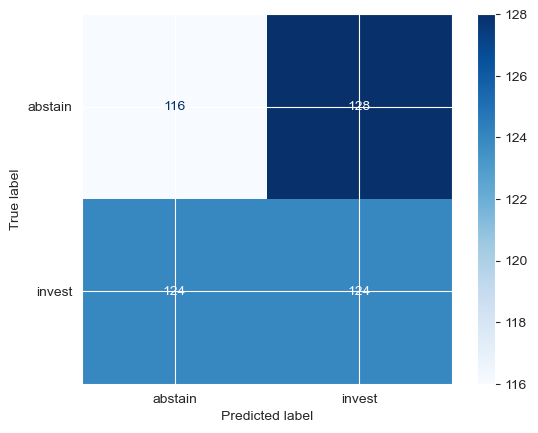

In [479]:
log_reg_print(X_train, X_test, y_train, y_test)

### DecisionTreeClassifier with Hyper-parameter Tuning

In [480]:
def dtc_print(x_train, x_test, Y_train, Y_test):
  dtree = DecisionTreeClassifier()
  tuning_grid = {'criterion':['gini','entropy'],'max_depth':np.arange(3,15)}
  gs = GridSearchCV(dtree, tuning_grid, cv=5)
  gs.fit(x_train, Y_train)
  print(classification_report(Y_test, gs.best_estimator_.predict(x_test)))
  conf_mat = confusion_matrix(Y_test, gs.best_estimator_.predict(x_test))
  display = ConfusionMatrixDisplay(confusion_matrix=conf_mat,
                                   display_labels=gs.classes_)
  display.plot(cmap=plt.cm.Blues)
  plt.show()

              precision    recall  f1-score   support

     abstain       0.44      0.34      0.39       244
      invest       0.47      0.57      0.52       248

    accuracy                           0.46       492
   macro avg       0.46      0.46      0.45       492
weighted avg       0.46      0.46      0.45       492



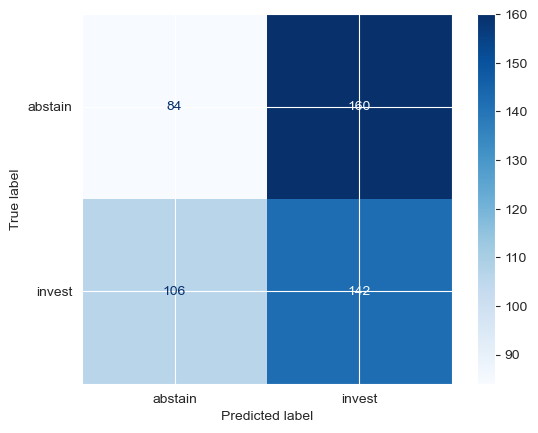

In [481]:
dtc_print(X_train, X_test, y_train, y_test)

### SVM with Hyper-parameter Tuning

In [482]:
def print_svm(x_train, x_test, Y_train, Y_test):
  param_grid = {'C': [0.1, 1, 10, 100, 1000],
                'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                'kernel': ['rbf']}

  gs = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3)

  gs.fit(x_train, Y_train)

  print(classification_report(Y_test, gs.best_estimator_.predict(x_test)))
  conf_mat = confusion_matrix(Y_test, gs.best_estimator_.predict(x_test))
  display = ConfusionMatrixDisplay(confusion_matrix=conf_mat,
                                   display_labels=gs.classes_)
  display.plot(cmap=plt.cm.Blues)

  plt.show()

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.503 total time=   0.0s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.505 total time=   0.0s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.505 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.505 total time=   0.0s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.505 total time=   0.0s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.503 total time=   0.0s
[CV 2/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.505 total time=   0.0s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.505 total time=   0.0s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.505 total time=   0.0s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.505 total time=   0.0s
[CV 1/5] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.503 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.01, kernel=rbf

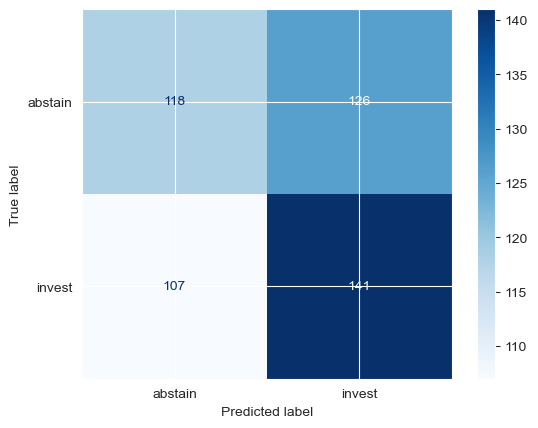

In [483]:
print_svm(X_train, X_test, y_train, y_test)

### KNN with Hyperparameter Tuning

In [484]:
def knn_print(x_train, x_test, Y_train, Y_test):
  knn_param_grid = {'leaf_size': list(range(1, 50)),
                    'n_neighbors': list(range(1, 30))}

  knn = KNeighborsClassifier()

  grid_search = GridSearchCV(knn, knn_param_grid, cv=10)

  grid_search.fit(x_train, Y_train)
  print(classification_report(Y_test, grid_search.best_estimator_.predict(x_test)))
  cm = confusion_matrix(Y_test, grid_search.best_estimator_.predict(x_test))
  disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                                display_labels=grid_search.classes_)
  disp.plot(cmap=plt.cm.Blues)

  plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

              precision    recall  f1-score   support

     abstain       0.51      0.52      0.52       244
      invest       0.52      0.50      0.51       248

    accuracy                           0.51       492
   macro avg       0.51      0.51      0.51       492
weighted avg       0.51      0.51      0.51       492



C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

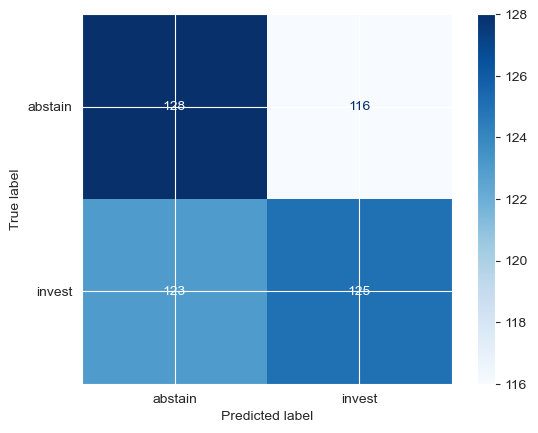

In [485]:
knn_print(X_train, X_test, y_train, y_test)

# Results

1. Best model: KNN did the best as far as accuracy AND what we value most in a model. As you can see the KNN model is the only model that had more true positives (we invested when we should have invested) than false positives (we invested when we shouldnt have invested, thus losing money). Even though the other models were very close in terms of accuracy, none of the other models managed to have more true positives than false positives. Because of this fact, we have to declare that the KNN model is the superior one and may actually offer a return on investment.
2. In all honestly, I am very surprised that we were able to achieve a small percentage over 50/50. Its definitely better than a coin flip, and not only this, whats more important to our model and our domain is that we minimize the false positives above all else which KNN did. I am surprised since, this being a time series problem, that we werent able to contextualize each row to have enough data for the model to pick up any sort of relationships. Furthermore, we generated a lot of features from a small set of columns and even had to trim down those columns since they were so tightly correlated.
3. I think KNN did the best since it seems to mostly rely on distances/differences and our features that we generated were largely differences in changes of rate, volume, & 'acceleration' of a stock price. Since our other models did well, I think we can assume that we have a well balanced model and given more options and time to the GridSearchCV, it may even find hyperparameters that are better


As for our business, we can actually calculate a rough profit from the number of false positives and true positives

$$
Profit = Invested • (125 + 125 • abs(stock_{i, increase})) - Invested • (116 + 116 * abs(stock_{i, decrease})) =
$$

$$
Profit = 125 • Invested + 125 • Invested • abs(stock_{i, increase}) - 116 • Invested - 116 • Invested • abs(stock_{i, decrease})
$$

$$
Profit = 125 • Invested - 116 • Invested + (125 • Invested • abs(stock_{i, increase}))  - (116 • Invested • abs(stock_{i, decrease}))
$$

$$
Profit = 9 • Invested + (125 • Invested • abs(stock_{i, increase}))  - (116 • Invested • abs(stock_{i, decrease}))
$$

$$
Profit = 9 • Invested + Invested • (125 • abs(stock_{i, increase})  - 116 • abs(stock_{i, decrease}))
$$


Where $stock_{increase}$ is the % increase of a stock on that particular day, $i$, and $stock_{decrease}$ is the % decrease of that stock on that particular day, $i$. Ideally, the difference between $\sum_{i=0} stock_{i, increase} - stock_{i, decrease}$ either approaches zero or is positive, this would indicate that the sum of returns that we get on days we correctly identity that we should trade is bigger than the sum of losses that we lose on days we shouldn't have invested but did.

### Feature Engineering Re-visited

For assignment 6, recall that we had already engineered multiple features for our models, their descriptions are again outlined here:

1. DateToQuarterTransformer: transform the date into a quarter, that we'll later use a oneHotEncoder on
2. TreasuryRateTransformer: get the rate of change for treasury rates using today and x days ago
3. DaysBackRateTransformer: put the rate of change from x amount of days ago for our stocks
4. TotalChangeOverDaysTransformer: get the total % of change over last x amount of days for all of our stocks
5. WouldProfitTargetTransformer: Add a target column by looking one day into the future to see if the stock went up
6. ExchangeVolumeChangeOverTime: calculate the % rate of change for volume for every exchange.
7. ExchangeCloseRateChange: calculate the % rate of change for Close price for every exchange.


#### Reasoning

The main motivation for these features was to give as much context to each row as we possibly could. Typically, our dataset/models would be treated as a 'time-series', however, this strategy is out of the purview of this exercise. We know from feature #5, that each row would basically know the future, that is it would know whether on that day we should invest or not, this was our target variable.

However, our model, when it looks at a single row, does not know why our target variable is 'abstain' or why it is 'invest'. It has no knowledge that we peeked into the future 1 day to create our target, which would be 'invest' if a trade made on that day and sold the following day would yield a profit, or 'abstain' if a trade made on that day and sold the following day would yield a loss. This was our first problem.

To solve this problem, we must give each row the context it needs so that our model has features it can look at and try to draw conclusions on why our target variable is 'invest' or why it is 'abstain'. We can give this context, by first giving each row the information about previous trading days and how different metrics (price, rate, volume, etc) have changed within the last 1,2,3,5,& 10 days. We focused on only these days since we are focusing on short term trades. This will encapsulate in each row, the knowledge that our models need to derive a relationship between our engineered feature columns, our raw data columns, and the target column. Also, note, that we at this point have already eliminated redundant columns by eliminating any columns that have a high correlation. This is what #2-#4,#6,#7 did, they give the row information about what happened in the market in the recent past.

While #1 is a little different, we wanted a way to encapsulate any patterns that other traders may follow due to date. We created the DateToQuarterTransformer to look at the date of each row, and create one hot encoding columns signifying which quarter the day was in. This should give our model information about how the markets behave as we move through the year, where the market could be affected by seasonal financial events that we cannot account for with the data on hand.

### Unit tests

* ensure that invalid dates are handled correcly
* ensure that if we get a zero rate change in our feature columns, its handled correctly


#### Testing which features behave best
We already tested our models with the all the features, but lets see what happens when we do not include the days back feature and the total change over days feature

In [498]:
featureEngPipelines: Dict[str, skl.pipeline.Pipeline] = create_feature_eng_pipeline(additional_exchange_dfs, False, False)

pipelines: Dict[str, skl.pipeline.Pipeline] = {}

#todo: this is to save time for now
for stock in [const.MSFT]:
  # cat_pipeline = Pipeline(steps=[('onehot_cat', MyOneHotEncoder(OneHotEncoder()))])
  # preproc = ColumnTransformer([('cat_pipe', cat_pipeline, cat_cols)], remainder='passthrough')
  pipe = Pipeline(steps=[
    ('feature_eng', featureEngPipelines[stock]),
    ('cleanup', RemoveBadRowsTransformer()),
    ('use_standard_scalar', ExcludeColsStandardScaler(['Quarter 1', 'Quarter 2', 'Quarter 3', 'Quarter 4'], stock)),
    ('remove_corr_cols', RemoveHighlyCorrCols(float(.99))),
    # ('preproc', preproc),
    # ('mdl', LogisticRegression(random_state=random_seed))
  ])
  pipelines[stock] = pipe

msft_df = pipelines[const.MSFT].fit_transform(initial_exchange)

target = 'MSFT_WouldProfit'
X_train, X_test, y_train, y_test = create_train_test_split(target, 42, 0.25, msft_df[target])

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3438: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3579: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


0.5263994502977554
              precision    recall  f1-score   support

     abstain       0.48      0.42      0.45       244
      invest       0.49      0.54      0.52       248

    accuracy                           0.48       492
   macro avg       0.48      0.48      0.48       492
weighted avg       0.48      0.48      0.48       492



C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


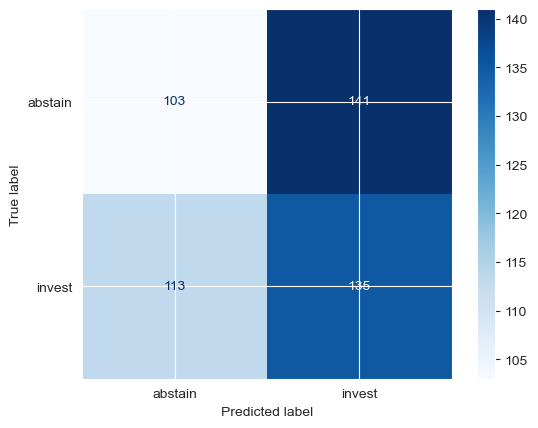

In [499]:
log_reg_print(X_train, X_test, y_train, y_test)

In [488]:
featureEngPipelines: Dict[str, skl.pipeline.Pipeline] = create_feature_eng_pipeline(additional_exchange_dfs, False, True)

pipelines: Dict[str, skl.pipeline.Pipeline] = {}

#todo: this is to save time for now
for stock in [const.MSFT]:
  # cat_pipeline = Pipeline(steps=[('onehot_cat', MyOneHotEncoder(OneHotEncoder()))])
  # preproc = ColumnTransformer([('cat_pipe', cat_pipeline, cat_cols)], remainder='passthrough')
  pipe = Pipeline(steps=[
    ('feature_eng', featureEngPipelines[stock]),
    ('cleanup', RemoveBadRowsTransformer()),
    ('use_standard_scalar', ExcludeColsStandardScaler(['Quarter 1', 'Quarter 2', 'Quarter 3', 'Quarter 4'], stock)),
    ('remove_corr_cols', RemoveHighlyCorrCols(float(.99))),
    # ('preproc', preproc),
    # ('mdl', LogisticRegression(random_state=random_seed))
  ])
  pipelines[stock] = pipe


msft_df = pipelines[const.MSFT].fit_transform(initial_exchange)

target = 'MSFT_WouldProfit'
X_train, X_test, y_train, y_test = create_train_test_split(target, 42, 0.25, msft_df[target])


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3438: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3579: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.503 total time=   0.0s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.505 total time=   0.0s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.505 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.505 total time=   0.0s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.505 total time=   0.0s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.503 total time=   0.0s
[CV 2/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.505 total time=   0.0s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.505 total time=   0.0s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.505 total time=   0.0s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.505 total time=   0.0s
[CV 1/5] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.503 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.01, kernel=rbf

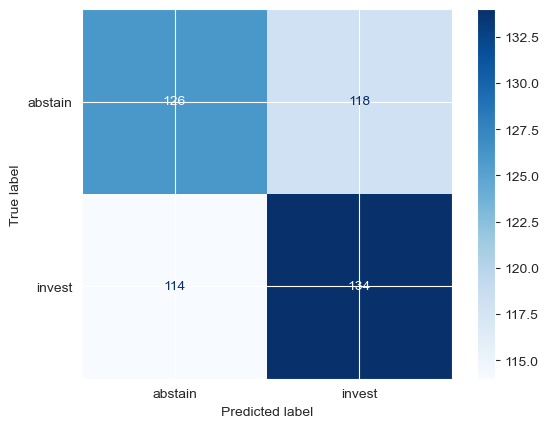

In [489]:
print_svm(X_train, X_test, y_train, y_test)

In [490]:
featureEngPipelines: Dict[str, skl.pipeline.Pipeline] = create_feature_eng_pipeline(additional_exchange_dfs, True, False)
pipelines: Dict[str, skl.pipeline.Pipeline] = {}

#todo: this is to save time for now
for stock in [const.MSFT]:
  # cat_pipeline = Pipeline(steps=[('onehot_cat', MyOneHotEncoder(OneHotEncoder()))])
  # preproc = ColumnTransformer([('cat_pipe', cat_pipeline, cat_cols)], remainder='passthrough')
  pipe = Pipeline(steps=[
    ('feature_eng', featureEngPipelines[stock]),
    ('cleanup', RemoveBadRowsTransformer()),
    ('use_standard_scalar', ExcludeColsStandardScaler(['Quarter 1', 'Quarter 2', 'Quarter 3', 'Quarter 4'], stock)),
    ('remove_corr_cols', RemoveHighlyCorrCols(float(.99))),
    # ('preproc', preproc),
    # ('mdl', LogisticRegression(random_state=random_seed))
  ])
  pipelines[stock] = pipe

msft_df = pipelines[const.MSFT].fit_transform(initial_exchange)

target = 'MSFT_WouldProfit'
X_train, X_test, y_train, y_test = create_train_test_split(target, 42, 0.25, msft_df[target])


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3438: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3579: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

              precision    recall  f1-score   support

     abstain       0.48      0.45      0.47       244
      invest       0.49      0.51      0.50       248

    accuracy                           0.48       492
   macro avg       0.48      0.48      0.48       492
weighted avg       0.48      0.48      0.48       492



C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

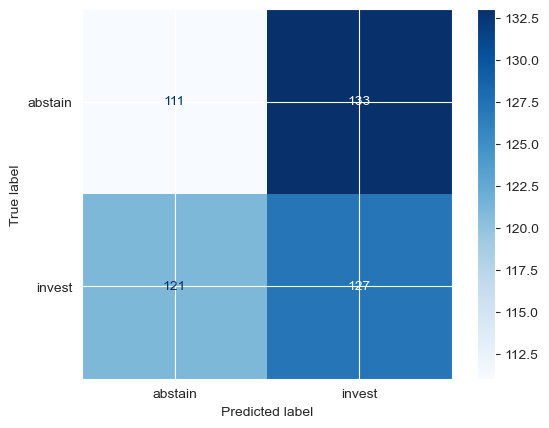

In [491]:
knn_print(X_train, X_test, y_train, y_test)

In [492]:
featureEngPipelines: Dict[str, skl.pipeline.Pipeline] = create_feature_eng_pipeline(additional_exchange_dfs, True,
                                                                                    False)
pipelines: Dict[str, skl.pipeline.Pipeline] = {}

#todo: this is to save time for now
for stock in [const.MSFT]:
  # cat_pipeline = Pipeline(steps=[('onehot_cat', MyOneHotEncoder(OneHotEncoder()))])
  # preproc = ColumnTransformer([('cat_pipe', cat_pipeline, cat_cols)], remainder='passthrough')
  pipe = Pipeline(steps=[
    ('feature_eng', featureEngPipelines[stock]),
    ('cleanup', RemoveBadRowsTransformer()),
    ('use_standard_scalar', ExcludeColsStandardScaler(['Quarter 1', 'Quarter 2', 'Quarter 3', 'Quarter 4'], stock)),
    ('remove_corr_cols', RemoveHighlyCorrCols(float(.99))),
    # ('preproc', preproc),
    # ('mdl', LogisticRegression(random_state=random_seed))
  ])
  pipelines[stock] = pipe

msft_df = pipelines[const.MSFT].fit_transform(initial_exchange)

target = 'MSFT_WouldProfit'
X_train, X_test, y_train, y_test = create_train_test_split(target, 42, 0.25, msft_df[target])




C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3438: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3579: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


              precision    recall  f1-score   support

     abstain       0.49      0.52      0.51       244
      invest       0.50      0.47      0.49       248

    accuracy                           0.50       492
   macro avg       0.50      0.50      0.50       492
weighted avg       0.50      0.50      0.50       492



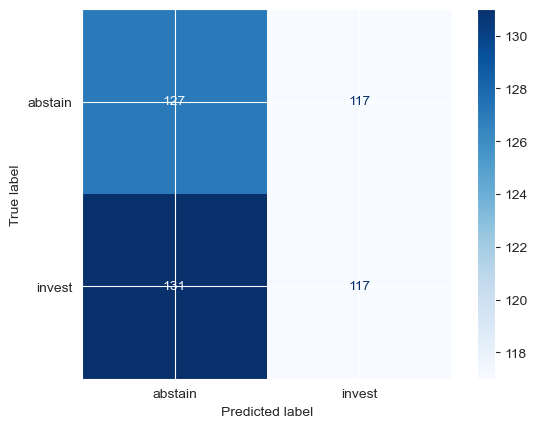

In [493]:
dtc_print(X_train, X_test, y_train, y_test)

### Results

Removing both features for logistic regression improved the accuracy by about 2%!

Removing total change over days only improved the Decision tree classifier

Removing Days back feature nominally improved our SVM model

Removing totalChange over days feature improved our KNN model